# Исследование рынка заведений общественного питания Москвы



![](//panels.twitch.tv/panel-79003445-image-03fc4d11-cefd-4d9e-b127-ab3e877c89e8)

**Заказчик** исследования — **Инвесторы из фонда «Shut Up and Take My Money»**.  

Необходимо *изучить рынок заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места*.  

Работаем с информацией о заведениях общественного питания Москвы, подготовленной на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Открытие файла с данными 

### Открытие таблицы

In [1]:
# Загружаем библиотеки

import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from plotly import graph_objects as go
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings("ignore")

In [2]:
# открываем датасет

data = pd.read_csv('/datasets/moscow_places.csv', sep=',')

# Устанавливаем максимальное количество выводимых на экран столбцов
pd.options.display.max_columns=40

In [3]:
# подгрузим файл с границами областей Москвы
with open('/datasets/admin_level_geomap.geojson', 'r') as f: 
    geomap = json.load(f)
    
moscow_lat, moscow_lng = 55.751244, 37.618423

### Вывод первых строк таблицы

In [4]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


### Описание данных 

Таблица **moscow_places** содержит следующую информацию:  

* **name** — название заведения;  
* **address** — адрес заведения;  
* **category** — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
* **hours** — информация о днях и часах работы;  
* **lat** — широта географической точки, в которой находится заведение;  
* **lat** — широта географической точки, в которой находится заведение;  
* **lng** — долгота географической точки, в которой находится заведение;  
* **rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
* **price** — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
* **avg_bill** — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
* **middle_avg_bill** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой *диапазон из двух значений*, в столбец *войдёт медиана* этих двух значений.  
Если в строке указано *одно число — цена без диапазона*, то в столбец *войдёт это число*.  
Если *значения нет или оно не начинается с подстроки «Средний счёт»*, то в столбец *ничего не войдёт*.  
* **middle_coffee_cup** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан *ценовой диапазон из двух значений*, в столбец *войдёт медиана* этих двух значений.  
Если в строке указано *одно число — цена без диапазона*, то в столбец *войдёт это число*.  
Если *значения нет или оно не начинается с подстроки «Цена одной чашки капучино»*, то в столбец *ничего не войдёт*.  
* **chain** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
 *0* — заведение не является сетевым  
 *1* — заведение является сетевым  
* **district** — административный район, в котором находится заведение, например Центральный административный округ;  
* **seats** — количество посадочных мест.  

### Общая информация о таблице

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Вывод по разделу

В представленном датасете хранится информация о 8406 заведениях.  
На первый взгляд проблем с типами столбцов не наблюдается, в дальнейшем можно изменить тип данных столбца с информацией о принадлежности заведения к сети на булев тип.  
Также в глаза бросается большое количество пропущенных значений в столбцах со стоимостями и количеством посадочных мест, вопрос о необходимости заполнениях которых рассмотрим чуть позже. 

## Предобработка данных

In [6]:
# создаем копию датасета, чтобы не работать с исходником
tmp = data.copy()

In [7]:
# создаем переменную, отображающую изначальное количество данных 
initial_data = data.shape[0]
initial_data

8406

In [8]:
# создаем функцию, которая будет вычислять долю оставшегося количества данных от изначального, 
# на случай, если будем удалять строки из таблицы

def shape_diff(df):
    sd = df.shape[0] / initial_data
    print (f'Доля оставшегося количества данных от изначального составляет {sd:.2%}')

### Изучение дубликатов в датафрейме

Проверим несколько столбцов с категориальными данными на наличие неявных дубликатов.
Будем смотреть на наличие ошибок в значениях и исправлять их, в случае большого количества уникальных значений будем пользоваться следующей функцией:

In [9]:
# подготовим функцию, которая будет удалять из значений столбцах лишние пробелы и различные знакие прининания, 
# которые могут встретиться в начале и конце строки, т.к. это наиболее частая ошибка

def space_del(col):
    print(f'unique before def - {tmp[col].nunique()}')
    tmp[col] = tmp[col].str.strip(' .,!?-_)(";%№:*=$^&')
    print(f'unique after def - {tmp[col].nunique()}')

In [10]:
tmp['name'].unique() 

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [11]:
space_del('name') 

unique before def - 5614
unique after def - 5611


In [12]:
tmp['category'].unique() 

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [13]:
tmp['address'].unique() 

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

In [14]:
space_del('address') 

unique before def - 5753
unique after def - 5753


In [15]:
tmp['district'].unique() 

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [16]:
tmp['price'].unique() 

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

По результату можно сделать вывод, что неявные дубликаты в данных почти отсутствуют, исправлено лишь 3 значения в названиях заведений.

In [17]:
tmp.duplicated().sum()

0

Явные дубликаты в данных отсутствуют.

### Изучение пропусков в датафрейме

Для начала узнаем сколько всего пропусков в каждом столбце и их долю.

In [18]:
tmp.isna().sum() # количество пропусков в каждом столбце

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [19]:
tmp.isna().mean().round(3)*100 # доля пропусков в каждом столбце

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.4
lat                   0.0
lng                   0.0
rating                0.0
price                60.6
avg_bill             54.6
middle_avg_bill      62.5
middle_coffee_cup    93.6
chain                 0.0
seats                43.0
dtype: float64

Пропущенные значения есть почти в половине столбцов, рассмотрим все по порядку.

hours - пропущенные значения в указанном столбце не сильно важны для целей исследования, но в тех же строках остаются ценные данные, поэтому заменим пропуски здесь на заглушку с текстом "unknown".  

Учитывая, что самостоятельно столбцы с пропущенными значениями заполнить не представляется возможным, ввиду отсутствия необходимой для этого информации, и нецелесообразно, во избежание искажения данных принято решение столбцы price, avg_bill, middle_avg_bill, middle_coffee_cup и seats оставить без изменений, заменив только пропущенные значения на те же заглушки для категориальных значений. Количественные оставим как есть.

In [20]:
tmp['hours'] = tmp['hours'].fillna('unknown')
tmp['price'] = tmp['price'].fillna('unknown')
tmp['avg_bill'] = tmp['avg_bill'].fillna('unknown')

Перед тем, как идти дальше, удостоверимся, что пустых ячеек не осталось.

In [21]:
tmp.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

### Изменение типов данных

Как мы и говорили ранее, тип данных столбца с информацией о принадлежности заведения к сети заменим на булев тип, хотя это и не является обязательным, т.к. можно работать с 0 и 1.

In [22]:
tmp['chain'] = tmp['chain'].astype(bool)

Изменение типов данных других колонок не требуется.

### Проверка количественных значений

Выведем общую статистику по количественным значениям.

In [23]:
tmp.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1288.000000


На lat и lng внимание не обращаем, т.к. это координаты.  
Аномалий в рейтингах не наблюдается, медиана и среднее почти равны.

В глаза бросаются максимальные значения среднего чека, средней стоимости чашки кофе и количества мест, очевидно, что это аномалии, посмотрим на эти колонки подробнее.

#### seats

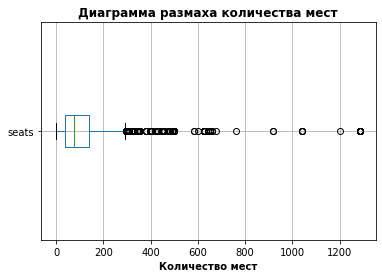

In [24]:
tmp['seats'].plot(kind='box', grid=True, vert=False)
plt.title('Диаграмма размаха количества мест', fontsize=12, fontweight="bold")
plt.xlabel("Количество мест", fontsize=10, fontweight="bold")
plt.show()

На диаграмме можно увидеть небольшое количество аномалий с количеством мест более 700 штук.

In [25]:
tmp.query('(seats >700)')['seats'].count() # посчитаем сколько аномалий

19

19 это не так много, поэтому удаляем их

In [26]:
tmp = tmp.query('(seats < 700) | seats.isna() ')

#### middle_coffee_cup

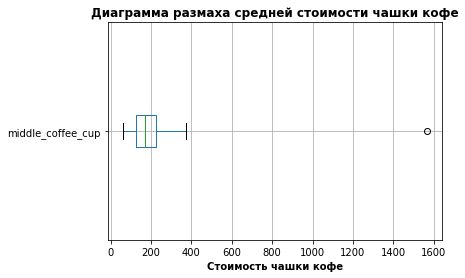

In [27]:
tmp['middle_coffee_cup'].plot(kind='box', grid=True, vert=False)
plt.title('Диаграмма размаха средней стоимости чашки кофе', fontsize=12, fontweight="bold")
plt.xlabel("Стоимость чашки кофе", fontsize=10, fontweight="bold")
plt.ylabel('')
plt.show()

Здесь всего одна аномалия и даже нет выбросов, избавимся и от нее.

In [28]:
tmp = tmp.query('middle_coffee_cup != 1568')

#### middle_avg_bill

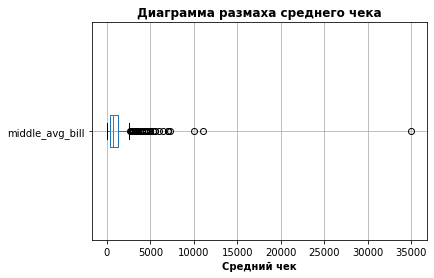

In [29]:
tmp['middle_avg_bill'].plot(kind='box', grid=True, vert=False)
plt.title('Диаграмма размаха среднего чека', fontsize=12, fontweight="bold")
plt.xlabel("Средний чек", fontsize=10, fontweight="bold")
plt.ylabel('')
plt.show()

Избавимся от двух аномалий с чеками выше 10 тыс.

In [30]:
tmp = tmp.query('(middle_avg_bill < 10000) | middle_avg_bill.isna() ')

#### итог

От аномальных значений избавились, остались только выбросы, можно посмотреть, что получилось.

In [31]:
tmp.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8383.000000,8383.000000,8383.000000,3141.000000,534.000000,4773.000000
mean,55.750199,37.608632,4.229739,939.656479,172.112360,104.244081
std,0.069656,0.098527,0.470747,769.161155,65.408333,102.903472
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000
25%,55.705343,37.538795,4.100000,375.000000,124.250000,40.000000
50%,55.753583,37.605310,4.300000,750.000000,168.000000,75.000000
75%,55.795108,37.664771,4.400000,1250.000000,225.000000,133.000000
max,55.928943,37.874466,5.000000,7250.000000,375.000000,675.000000


In [32]:
shape_diff(tmp) 

Доля оставшегося количества данных от изначального составляет 99.73%


### Добавление дополнительных столбцов

#### street

Создадим столбец street с названиями улиц из столбца с адресом.

In [33]:
tmp['street'] = tmp['address'].astype(str).apply(lambda x: x.split(',')[1])

In [34]:
random = tmp.sample(3) # посмотрим три случайные строки для проверки
random

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
7384,Весна,кафе,"Москва, МКАД, 14-й километр, 2, стр. 55",Юго-Восточный административный округ,"ежедневно, 08:00–21:00",55.653967,37.824213,4.9,unknown,unknown,NaN,NaN,True,NaN,МКАД
7759,Яндекс Лавка,ресторан,"Москва, улица Генерала Тюленева, 4А, стр. 1",Юго-Западный административный округ,"ежедневно, 07:00–23:00",55.626031,37.483639,3.8,unknown,unknown,NaN,NaN,True,90.0,улица Генерала Тюленева
1676,French Bakery,кофейня,"Москва, Бутырская улица, 97",Северный административный округ,пн-пт 07:30–23:00; сб 08:00–22:00; вс 09:00–21:00,55.807772,37.580239,4.4,unknown,unknown,NaN,NaN,True,0.0,Бутырская улица


#### is_24x7

Далее добавим столбец is_24x7 булева типа с обозначением, что заведение работает ежедневно и круглосуточно.  
В столбце будет только два вида значений:  
- True — если заведение работает ежедневно и круглосуточно;  
- False — в противоположном случае.

In [35]:
tmp['is_24x7'] = tmp['hours'].apply(lambda x: True if "ежедневно, круглосуточно" in x else False)

In [36]:
#tmp.loc[tmp['is_24x7'] == True] 
#tmp.loc[tmp['is_24x7'] == False] # для самопроверки

In [37]:
tmp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24x7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,False,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,Правобережная улица,False


### Вывод по разделу

1. На этапе предобработки в представленной таблице нами было обнаружено, что пропущенные значения есть почти в половине столбцов, в связи с чем было принято следующее решение:  
  * Учитывая, что самостоятельно столбцы с пропущенными значениями заполнять нецелесообразно и не представляется возможным, ввиду отсутствия необходимой для этого информации, во избежание искажения данных принято решение столбцы hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats оставить без изменений, заменив только пропущенные значения на "заглушки" для категориальных значений. Количественные оставлены в изначальном виде.  
  
  
2. *Изменен тип данных* столбца с информацией о принадлежности заведения к сети на булев тип.  

3. Явные строки-дубликаты в данных отсутствовали, удалено 3 неявных строки-дубликаты.  

4. На основе имеющихся данных таблицы были *добавлены новые столбцы*, необходимые для дальнейшего анализа.    

5. В столбцах с количественными значениями были выявлены *аномалии* у максимальных значений среднего чека, средней стоимости чашки кофе и количества мест, аномалии удалены. 

**Доля оставшегося количества данных от изначального составляет 99.73%**

## Анализ данных

### Количество заведений

Рассмотрим какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям и ответим на вопрос о распределении заведений по категориям.

In [38]:
data_cat = pd.DataFrame(tmp['category'].value_counts()) # подготовим отдельную таблицу с категориями и количеством заведений
#data_cat

In [39]:
fig = px.bar(data_cat, 
             x=data_cat.index, 
             y='category', 
             text='category',
             color_discrete_sequence=px.colors.qualitative.Dark24_r
            )
fig.update_layout(width=1000,
                  height=500,
                  title='Распределение количества заведений по категориям',
                  yaxis_title='Количество заведений',
                  xaxis_title='Категория заведения')
fig.show()

В таблице представлено 8 категорий заведений. График распределения заведений по категориям показывает нам, что в Москве наиболее всего распространены кафе, рестораны и кофейни, менее же всего в Москве булочных и столовых.

### Количество посадочных мест

Теперь исследуем количество посадочных мест в местах по категориям.  
Для этого узнаем медианное значение посадочных мест в каждой категории.

In [40]:
data_seat = pd.DataFrame(tmp['seats'].groupby(tmp['category']).median().round().sort_values(ascending = False))
#data_seat

In [41]:
fig = px.bar(data_seat, 
             x=data_seat.index, 
             y='seats', 
             text='seats',
             color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_yaxes(range=(40, 100))
fig.update_layout(title='Распределение медианного количества посадочных мест по категориям',
                  width=1000,
                  height=500,
                  yaxis_title='Медианное количество посадочных мест',
                  xaxis_title='Категория заведения')
fig.show()

Диаграмма показывает, что зачастую больше всего посадочных мест в заведениях типа: ресторан, бар/паб, кофейня.  
Наименее - в булочных и пиццериях. Это связано с тем, что пиццерии чаще всего работают на доставку, а булочных продажа "с собой".

### Cоотношение сетевых и несетевых заведений

Рассмотрим соотношение сетевых и несетевых заведений, узнаем каких заведений больше, какие категории заведений чаще являются сетевыми.

In [42]:
piv = tmp.pivot_table(
        index=['chain','category'],
        values='name', 
        aggfunc='count').reset_index()
piv.columns = ['chain', 'cat', 'tot']
piv = piv.replace([True, False],['Сетевое', 'Несетевое'])
#piv

In [43]:
fig = go.Figure(
    data=[go.Pie(
        labels=piv['chain'], 
        pull = .05,
        values=piv['tot'],
        insidetextorientation='radial'  
        )])
fig.update_layout(title='Общее количественное соотношение сетевых и несетевых заведений',
                  title_x = 0.15, 
                  legend=dict(
                             orientation='v',
                             x=.7,
                             y=1.07),
                  width=800,
                  height=600)
fig.update_traces(textposition='inside', textinfo='value+percent', hoverinfo='label', textfont_size=15,
                  marker=dict(colors=['820000'],line=dict(color='#000000', width=1))) 

fig.show()

In [44]:
fig = px.bar(piv, 
             y='tot', 
             x='cat', 
             color='chain',
             barmode='group',
             text='tot',
             hover_name='chain',
             color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_xaxes(categoryorder='total descending')
fig.update_layout(title='Количественное соотношение сетевых и несетевых заведений по категориям',
                  title_x = 0.5,
                  width=1000,
                  height=500,
                  legend=dict(title=' ',
                             orientation='h',
                             x=.37,
                             y=.93),
                   yaxis_title='Количество заведений',
                   xaxis_title='Категория заведения')
fig.show()

In [45]:
tru = tmp.query('chain == True').groupby('category').count()
fal = tmp.query('chain == False').groupby('category').count()
ratio = pd.DataFrame(tru['chain'] / (tru['chain'] + fal['chain']) *100).round().sort_values(by='chain', ascending=False)
#ratio

In [46]:
fig = px.bar(ratio, 
             x=ratio.index, 
             y='chain', 
             barmode='group',
             text='chain',
             color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_xaxes(categoryorder='total descending').update_yaxes(range=(15, 70))
fig.update_layout(title='Соотншение количества сетевых заведений к общему числу заведений по категориям',
                  title_x = 0.5,
                  width=1000,
                  height=500,
                  legend=dict(title='Является ли сетевым',
                             orientation='h',
                             x=.3,
                             y=.93),
                   yaxis_title='Категория заведений',
                   xaxis_title='Процент сетевых заведений')
fig.show()

Графики наглядно показывают нам, что всего несетевых заведений в Москве значительно больше, чем сетевых. У кафе, ресторанов и кофеен самое большое количество несетевых заведений, однако и самое большое количество сетевых. Чаще всего сетевыми заведениями являются булочные и пиццерии.

### Топ-15 сетей по количеству заведений

Теперь посмотрим на топ-15 популярных сетей в Москве по количеству заведений.

In [47]:
top15 = (
        tmp.
        loc[tmp['chain'] == True].
        pivot_table(
                    index = ['name', 'category'],
                    values = 'rating',
                    aggfunc = 'count'
                    )
)
top15.columns = ['total_count']
top15 = top15.reset_index().sort_values(by='total_count', ascending=False).head(15)
top15

,name,category,total_count
1139,Шоколадница,кофейня,117
504,Домино'с Пицца,пиццерия,76
497,Додо Пицца,пиццерия,74
206,One Price Coffee,кофейня,70
1155,Яндекс Лавка,ресторан,68
73,Cofix,кофейня,65
242,Prime,ресторан,49
558,КОФЕПОРТ,кофейня,42
644,Кулинарная лавка братьев Караваевых,кафе,39
976,Теремок,ресторан,36


In [48]:
fig = px.bar(top15, 
             y='total_count', 
             x='name', 
             color='category',
             text='total_count',
             hover_name='category',
             color_discrete_sequence=px.colors.qualitative.Dark24_r
            )
fig.update_layout(title='Топ-15 сетей по количеству заведений',
                  title_x = 0.5,
                  width=1000,
                  height=500,
                  legend=dict(title='Категория заведения',
                             orientation='v'),
                   yaxis_title='Количество заведений',
                   xaxis_title='Название сети')
fig.show()

Глядя на график можно отметить, что в топе преобладают сети из категории кофейня и в него не попали представители категорий: бар/паб, столовая и быстрое питание.

### Административные округи

Рассмотрим заведения по округам.

In [49]:
# добавим колонку с сокращенными названиями админ. округов для компактной визуализации на графике

tmp['AO'] = tmp['district'].replace(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], ['CАО','СВАО', 'СЗАО', 'ЗАО', 'ЦАО', 'ВАО', 'ЮВАО', 'ЮАО', 'ЮЗАО'])

In [50]:
fig = px.histogram(tmp, 
                   y="AO", 
                   color="category", 
                   histfunc="count",
                   color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_yaxes(categoryorder='total ascending')

fig.update_layout(title='Количество заведений по категориям в разрезе административных округов',
                  title_x = 0.15, 
                  legend=dict(title = '',
                             orientation='h',
                             y=1.08),
                  width=1000,
                  height=500,
                  yaxis_title='Административный округ',
                  xaxis_title='Количество заведений')

fig.show()

Как и стоило ожидать, центр Москвы самое популярное место, поэтому и количество заведений здесь с большим отрывом выделяется на фоне остальных округов.

Количество баров/пабов также сильно выделяется в ЦАО по сравнению с другими округами. В центре чаще гуляют, поэтому для любителей пива здесь таких заведений сделано побольше.  

Стоит отметить, что количество пиццерий примерно одинаково во всех округах, скорее всего это связано с тем, что они чаще всего ориентируются на доставку, поэтому разбросаны почти равномерно по всем округам.

### Рейтинги

Рассмотрим средние рейтинги по категориям заведений.

In [51]:
fig = px.histogram(tmp, 
                   y="rating", 
                   x="category", 
                   histfunc="avg",
                   color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_yaxes(categoryorder='total descending', 
                           range=(4,4.5),  
                           nticks=6).update_xaxes(categoryorder='total descending')

fig.update_layout(title='Средний рейтинг по категориям заведений',
                  title_x = .5, 
                  legend=dict(title = '',
                             orientation='h',
                             y=1.07),
                  width=1000,
                  height=500,
                  yaxis_title='Средний рейтинг',
                  xaxis_title='Категория заведения')

fig.show()

У всех типов общепита оценка не ниже 4 и находится в диапазоне между 4 и 4.4. Худший показатель у заведений быстрого питания, но в целом у всех категорий оценки примерно равные.

### Хороплет с рейтингами заведений

Визуализируем средний рейтинг заведений Москвы по райнам, построив хороплет.

In [52]:
AO_rate = tmp.groupby('district', as_index=False)['rating'].agg('mean')
#AO_rate

In [53]:
choro_rate = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geomap,
    data=AO_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
    width=1000,
    height=500,
).add_to(choro_rate)

choro_rate

Теперь выведем на карту все заведения с помощью кластеров.

In [54]:
marker_cluster = MarkerCluster().add_to(choro_rate)

def create_clusters(row):
    Marker([row['lat'], row['lng']], popup=f"{row['name']} {row['rating']} {row['AO']}").add_to(marker_cluster)

tmp.apply(create_clusters, axis=1)

choro_rate

### Топ-15 улиц по количеству заведений

Подготовим топ-15 улиц по количеству заведений, затем построим график распределения количества заведений и их категорий по этим улицам.

In [55]:
# готовим таблицу из 15 улиц с самым большим количеством заведений
str15 = (
        tmp.
        pivot_table(
                    index = 'street',
                    values = 'name',
                    aggfunc = 'count'
                    )
)
str15.columns = ['total_count']
str15 = str15.reset_index().sort_values(by='total_count', ascending=False).head(15)

#str15

In [56]:
# делаем список этих улиц
str15 = str15['street'].tolist()

In [57]:
# оставляем в основной таблице только те заведения, которые находятся на этих 15 улицах
str15 = tmp.query('street in @str15')

In [58]:
#str15['street'].nunique() # для самопроверки

In [59]:
fig = px.histogram(str15, 
                   x="street", 
                   color="category", 
                   histfunc="count",
                   color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_xaxes(categoryorder='total descending')

fig.update_layout(title='Топ-15 улиц по количетсву заведений общепита по категориям',
                  title_x=.5, 
                  legend=dict(title = '',
                             orientation='h', 
                             y=1.07),
                  width=1000,
                  height=600,
                  xaxis_title='Название улицы',
                  yaxis_title='Количество заведений')

fig.show()

Можно отметить, что в топ-15 улиц в основном вошли проспекты и шоссе, поэтому очевидно, что на самых длинных улицах располагается больше всего заведений.

### Одна улица - одно заведение

Теперь рассмотрим улицы, на которых находится только одно единственное заведение, распределив их по категориям.

In [60]:
only_one = tmp['street'].value_counts().reset_index().query('street == 1')
only_one = only_one['index'].tolist()
only_one = tmp.query('street in @only_one')
#only_one['street'].nunique() 
only_one

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24x7,AO
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,False,180.0,улица Бусиновская Горка,False,CАО
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,unknown,unknown,NaN,NaN,False,NaN,Прибрежный проезд,False,CАО
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,NaN,NaN,True,NaN,парк Левобережный,False,CАО
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,True,NaN,Угличская улица,False,СВАО
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,unknown,unknown,NaN,NaN,True,NaN,ландшафтный заказник Лианозовский,False,СВАО
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,unknown,unknown,NaN,NaN,False,90.0,улица Шкулёва,False,ЮВАО
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,unknown,NaN,NaN,False,NaN,улица Артюхиной,False,ЮВАО
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,unknown,unknown,NaN,NaN,True,NaN,Кузьминская улица,False,ЮВАО
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,unknown,unknown,NaN,NaN,True,40.0,Новороссийская улица,False,ЮВАО


In [61]:
only_one = pd.DataFrame(only_one['category'].value_counts())
#only_one

In [62]:
fig = go.Figure(
    data=[go.Pie(
        labels=only_one.index, 
        values=only_one['category'], 
        pull = ([.05, .05, .05]), 
        hole = .38,
        insidetextorientation='horizontal'  
        )])
fig.update_layout(title='',
                  title_x = 0.15, 
                  legend=dict(
                             orientation='h',
                             x=.06,
                             y=1.10),
                  width=800,
                  height=800,
                  annotations=[dict(
                      x=0.5, 
                      y=0.52,
                      font_size=21,
                      text='Только одно<br>заведение на улице <br>по категориям', 
                      showarrow=False)]
)
fig.update_traces(textposition='outside', textinfo='label+percent', hoverinfo='value+percent', textfont_size=18,
                  marker=dict(colors=['820000'],line=dict(color='#000000', width=1)))
fig.show()


Можно заметить, что даже при таких условиях по количеству лидируют кафе, рестораны и кофейни.

### Хороплет среднего чека

In [63]:
AO_bill = tmp.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
AO_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [64]:
choro_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geomap,
    data=AO_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdBu',
    fill_opacity=0.6,
    legend_name='Средний чек в заведениях по округам, руб.',
).add_to(choro_bill)

#marker_cluster2 = MarkerCluster().add_to(choro_bill)

#def create_clusters2(row):
#    Marker([row['lat'], row['lng']], popup=f"{row['name']} {row['middle_avg_bill']} {row['AO']}").add_to(marker_cluster2)

#tmp.apply(create_clusters2, axis=1)

choro_bill

Очевидно, что самым дорогим районом Москвы по среднему чеку стал центральный, однако нельзя сказать, что этот показатель напрямую зависит от расстояние до центра города, так мы можем заметить, что помимо центра средний чек находится нам том же уровне и в западном районе.

### Вывод по разделу

В данных представлено 8 категорий заведений. Мы выяснили, что в Москве наиболее всего распространены кафе, рестораны и кофейни, менее же всего в Москве булочных и столовых. Менее всего в Москве представлено булочных и столовых.	

Больше всего посадочных мест, очевидно, зачастую в заведениях типа: ресторан, бар/паб, кофейня. Наименее - в булочных и пиццериях. Это связано с тем, что пиццерии чаще всего работают на доставку, а булочных продажа "с собой".

Почти 62% заведений общепита в Москве являются несетевыми. У кафе, ресторанов и кофеен самое большое количество несетевых заведений, однако и самое большое количество сетевых. Чаще всего сетевыми заведениями являются булочные и пиццерии.

При рассмотрении топ-15 сетей по количеству заведений мы выяснили, что лидером является категория кофеен, большего всего сетей из топа именно в этой категории. Стоит отметить, что в топ не попали представители категорий: бар/паб, столовая и быстрое питание.

Исследуя заведения по административным округам, мы увидели, как и стоило ожидать, что количество заведений в центре Москвы с большим отрывом выделяется на фоне остальных округов в связи со своей популярностью.

Количество баров/пабов также сильно выделяется в ЦАО по сравнению с другими округами. В центре чаще гуляют, поэтому для любителей пива здесь таких заведений сделано больше.

Стоит отметить, что количество пиццерий примерно одинаково во всех округах, скорее всего это связано с тем, что они чаще всего ориентируются на доставку, поэтому разбросаны почти равномерно по всем округам.

Что касается рейтингов заведений, у всех категорий общепита оценка не ниже 4 и находится в диапазоне между 4 и 4.4. Худший показатель у заведений быстрого питания, но в целом у всех категорий оценки примерно равные.

При составлении топ-15 улиц по количеству заведений, мы заметили, что в основном в него вошли проспекты и шоссе, предположив, что это связано с тем, что на самых длинных улицах располагается больше всего заведений, поэтому это очевидно.

Рассматривая улицы, на которых находится только одно единственное заведение, мы заметили, что даже среди них по количеству лидируют кафе, рестораны и кофейни.

Самым дорогим районом Москвы по среднему чеку, очевидно, стал центральный, однако нельзя сказать, что этот показатель напрямую зависит от расстояние до центра города, так мы можем заметить, что помимо центра средний чек находится нам том же уровне и в западном районе.

## Детализация исследования: открытие кофейни

Основатели фонда «Shut Up and Take My Money» мечтают открыть кофейню в Москве. 
Попробуем определить, осуществима ли их мечта.

Для начала посмотрим сколько всего кофеен в датасете, в каких районах их больше всего и каковы особенности их расположения.

In [65]:
# сделаем отдельный датасет, в котором оставим только кофейни

cofe = tmp.query('category == "кофейня"')
cofe

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24x7,AO
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко,False,CАО
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,NaN,NaN,True,NaN,парк Левобережный,False,CАО
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,unknown,unknown,NaN,NaN,True,46.0,Коровинское шоссе,False,CАО
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,unknown,unknown,NaN,NaN,True,NaN,улица Маршала Федоренко,False,CАО
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,unknown,unknown,NaN,NaN,True,NaN,улица Дыбенко,False,CАО
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,unknown,unknown,NaN,NaN,False,NaN,Люблинская улица,False,ЮВАО
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,unknown,Цена чашки капучино:100–220 ₽,NaN,160.0,False,206.0,Волгоградский проспект,False,ЮВАО
8376,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,unknown,unknown,NaN,NaN,False,NaN,Грайвороновская улица,False,ЮВАО
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,unknown,Цена чашки капучино:80–120 ₽,NaN,100.0,False,NaN,Новохохловская улица,False,ЮВАО


### Количество кофеен

Как мы уже ранее выяснили, в представленных данных 1409 кофеен, чуть больше половины которых являются сетевыми.  
Также нам известно, что медианное количество посадочных место в кофейнях равно 80.  
Все это подтверждают нижеуказанные графики, ранее построенные нами.

![](//i.ibb.co/KqTkmcL/image.png)
![](//i.ibb.co/vZkbPDW/image.png)
![](//i.ibb.co/2YY2Z3S/image.png)

### Кофейни по округам

Посмотрим на распределение кофеен по округам, построив гистограмму.

In [66]:
fig = px.histogram(cofe, 
                   x="AO",
                   y="name",
                   histfunc="count",
                   color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_xaxes(categoryorder='total descending')

fig.update_layout(title='Количество кофеен по округам',
                  title_x=.5, 
                  legend=dict(title = '',
                             orientation='h', 
                             y=1.07),
                  width=1000,
                  height=400,
                  yaxis_title='Количество кофеен',
                  xaxis_title='Округ')

fig.show()

Если не брать в расчет центральный округ, в котором невероятно много кофеен по сравнению с другими округами, то в тройке по количеству САО, СВАО и ЗАО. На фоне остальных выделяется северо-западный округ, в котором очень мало кофеен, поэтому если смотреть с точки зрения конкуренции, то я бы советовал рассмотреть именно этот округ. 

### Рейтинги кофеен

Посмотрим распределение рейтингов кофеен по районам.

In [67]:
fig = px.histogram(cofe, 
                   y="rating", 
                   x="AO", 
                   histfunc="avg",
                   color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_yaxes(categoryorder='total descending', 
                           range=(4,4.5),  
                           nticks=6).update_xaxes(categoryorder='total descending')

fig.update_layout(title='Средний рейтинг по категориям заведений',
                  title_x = .5, 
                  legend=dict(title = '',
                             orientation='h',
                             y=1.07),
                  width=1000,
                  height=500,
                  yaxis_title='Средний рейтинг',
                  xaxis_title='Категория заведения')

fig.show()

Как мы видим средний рейтинг кофеен по округам везде практически одинаковый и находится в диапозоне между 4.19 и 4.33.
Стоит отметить, что СЗАО на втором вместе и имеет минимальную разницу с ЦАО.

### Стоимость чашки капучино и расположение на карте

Теперь разберемся на какую стоимость чашки капучино стоит ориентироваться при открытии и почему.

In [68]:
cofe['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Из полученных данных (данные о цене чашки представлены только по 520 кофейням из 1409) можем увидеть, что ценник на чашку варьируется между 60 и 375 руб. В среднем чашка капучино в Москвовской кофейне будет обходиться вам в районе 170 руб.

Взглянем на распределение средней стоимости чашки капучино по райном, построив хороплет, заодно более внимательно исследуем расположение кофеен на карте.

In [69]:
cofe_bill = cofe.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
#cofe_bill

In [70]:
choro_cofe_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geomap,
    data=cofe_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='RdBu',
    fill_opacity=0.6,
    legend_name='Средняя цена за чашку капучино в кофейнях по районам',
).add_to(choro_cofe_bill)

marker_cluster3 = MarkerCluster().add_to(choro_cofe_bill)

def create_clusters3(row):
    Marker([row['lat'], row['lng']], popup=f"{row['name']} {row['middle_coffee_cup']} {row['rating']}").add_to(marker_cluster3)

cofe.apply(create_clusters3, axis=1)

choro_cofe_bill

Предлагаю снова рассмотреть СЗАО, хороший вариант, потому что по сравнению с другими округами цена за чашку капучино на северо-западе будет не дороже одних и не дешевле других, средняя цена здесь 156-167 руб, поэтому предлагается на первое время установить ценник в 150-160 руб.  

Также обратите внимание на плотность кофеен в этом округе, есть довольно много райнов, где кофейни отсутствуют, поэтому предлагаю рассмотреть именно этот округ, здесь довольно много вариантов. Со своей стороны выделю три следующих варианта размещения:
* район Митино (в районе ст. м. Митино и Пятницкое шоссе)
* близь Хорошёвского моста, например в районе одноименной остановки - рядом нет кофеен, место примечательно тем, что находится на въезде в Серебряный бор;
* в районе ст. м. Хорошёво - при желании расположиться ближе к центру Москвы.

Отмечены на карте ниже.


In [71]:
mit_lat, mit_lng = 55.846723, 37.360467

pyat_lat, pyat_lng = 55.854924, 37.353648

sereb_lat, sereb_lng = 55.780210, 37.448643

hor_lat, hor_lng = 55.777228, 37.506877

offer_map = Map(location=[sereb_lat, sereb_lng], zoom_start=11, tiles='Cartodb Positron')
Marker([mit_lat, mit_lng], popup='ст. м. Митино').add_to(offer_map)
Marker([pyat_lat, pyat_lng], popup='ст. м. Пятницкое шоссе').add_to(offer_map)
Marker([sereb_lat, sereb_lng], popup='въезд в Серебряный бор').add_to(offer_map)
Marker([hor_lat, hor_lng], popup='ст. м. Хорошёво').add_to(offer_map)

offer_map

### Круглосуточные кофейни

In [72]:
cofe['is_24x7'] = cofe['is_24x7'].replace([True, False],['Круглосуточное', 'Некруглосуточное'])

In [73]:
fig = go.Figure(
    data=[go.Pie(
        labels=cofe['is_24x7'], 
        pull = .2,
        insidetextorientation='horizontal'  
        )])
fig.update_layout(title='Соотношение количества круглосуточных и некруглосуточных кофеен',
                  title_x = .18, 
                  legend=dict(
                             orientation='v',
                             x=.23,
                             y=.95),
                  width=1000,
                  height=600)
fig.update_traces(textposition='inside', textinfo='percent', hoverinfo='value+label', textfont_size=15,
                  marker=dict(colors=['820000'],line=dict(color='#000000', width=1))) 

fig.show()

In [74]:
сofe_time = cofe.query('is_24x7 == "Круглосуточное"').groupby('AO')['name'].count().reset_index()

In [75]:
fig = px.bar(сofe_time, 
             x='AO', 
             y='name', 
             text='name',
             color_discrete_sequence=px.colors.qualitative.Dark24_r
            ).update_xaxes(categoryorder='total descending')
fig.update_layout(title='Распределение круглосуточных кофеен по округам',
                  title_x = 0.5,
                   yaxis_title='Количество заведений',
                   xaxis_title='Административный округ')
fig.show()

Как мы видим, лишь 4.19% кофеен работают круглосуточно, подавляющее число которых располагаются в центральном округе.  
Действительно, это имеет смысл, если кофейня расположена ближе к центру, потому что там наибольшая проходимость, люди часто гуляют по центру даже ночью, однако в остальных районах я бы все-таки рекомендовал не делать кофейню круглосуточной, т.к. это в большинстве случаев не стоит своих денег.

### Вывод по разделу - рекомендации

В представленных данных 1409 кофеен, чуть больше половины которых являются сетевыми.

Медианное количество посадочных мест в кофейнях равно 80.

С большим отрывом Центральный округ является лидером по количеству кофеен, далее расположились САО, СВАО и ЗАО.  
На фоне остальных выделяется СЗАО, в котором очень мало кофеен, поэтому, с точки зрения конкуренции, я бы советовал рассмотреть именно этот округ к размещению своей кофейни.

Средний рейтинг кофеен по округам везде практически одинаковый и находится в диапазоне между 4.19 и 4.33.  
Стоит отметить, что СЗАО на втором месте по рейтингу и имеет минимальную разницу с ЦАО.

Согласно имеющимся данным нам известно, что в Москве цена на чашку капучино варьируется между 60 и 375 руб.   
В среднем чашка капучино в Московской кофейне будет обходиться вам в районе 170 руб.  
Самый дорогой капучино в Москве в ЦАО, ЗАО и ЮЗАО, дешевый – в ВАО, ЮАО и ЮВАО.  
СЗАО хороший вариант для размещения, потому что по сравнению с другими округами цена за чашку капучино на Северо-Западе будет не дороже одних и не дешевле других округов, средняя цена здесь 156-167 руб, поэтому предлагается на первое время установить ценник в 150-160 руб.  

Также стоит обратить внимание на плотность размещения кофеен в этом округе, есть довольно много районов, где кофейни отсутствуют, поэтому предлагается рассмотреть именно этот округ, здесь довольно много вариантов. Предлагается рассмотреть три следующих варианта размещения:
*	район Митино (в районе ст. м. Митино и Пятницкое шоссе)
*	близь Хорошёвского моста, например, в районе одноименной остановки - рядом нет кофеен, место примечательно тем, что находится на въезде в Серебряный бор;
*	в районе ст. м. Хорошёво - при желании расположиться ближе к центру Москвы.


## Презентация по результатам исследования

Презентация: <https://disk.yandex.ru/i/P7ylBSc9-tP6eg>  
Приятного просмотра!:)